<a href="https://colab.research.google.com/github/kkr016/Image_segmentation_CV/blob/main/_codes.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Technology used: OpenCv, WaterShed Algorithm, Image Preprocessing, pandas, numpy



The Given images were categorized into 3 

  * Full grains
  * Half grains
  * Mixed grains 

Approach I used for

1.	Importing Required Libraries and packages
2.	Image Pre-Processing
  1.	Grayscale Conversion
  2.	Image Thresholding
  3.	Noise Removal
  4.	Gaussian blurring
  5.	foreground object using erode function


3.	using Contours method to find the count the no of object and show the Contour filled in real image

4.	Applying Watershed Algorithm for Solving grains touching problem
5.	Counting total Rice grains and Broken Rice grains using the contour area


Objective of the program

Count the number of rice grains in the Image and Find the number of broken grains in the given image.

Three implementations in this approach are:
1.	Image Preprocessing
2.	Solving Grains touching problem
3.	Counting broken rice


In [ ]:
!pip install cvlib

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from cvlib.object_detection import draw_bbox
import numpy.polynomial.polynomial as poly

from google.colab.patches import cv2_imshow

In [ ]:
#define the show func
def show(image):
  img=cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  plt.figure(figsize=(12,12))
  plt.imshow(img)

#read the image

(2250, 4000, 3)


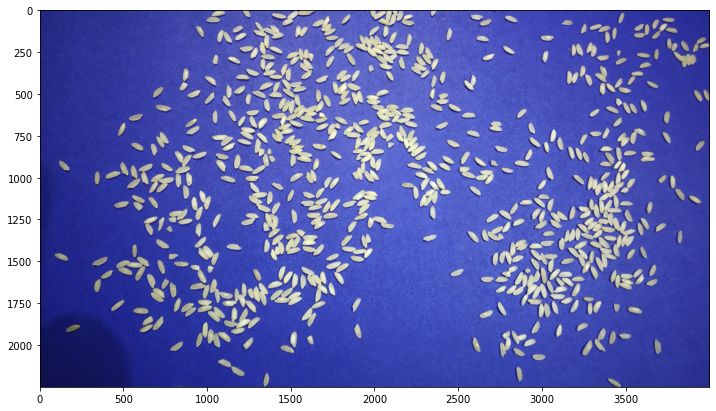

In [ ]:
input = cv2.imread('/content/full_grain_3.jpg')

image = cv2.cvtColor(input, cv2.COLOR_BGR2RGB)
show(input)
print(input.shape)

#Image Pre-processing

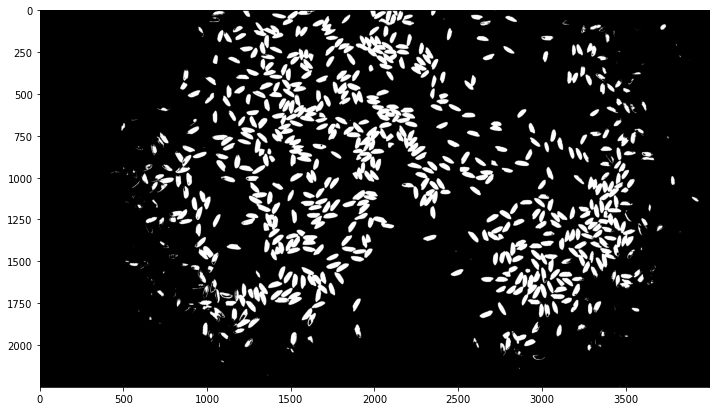

In [ ]:
#convert the raw image to the gray and then covert the gray image to threshold
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
_, thresh = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY)
show(thresh)

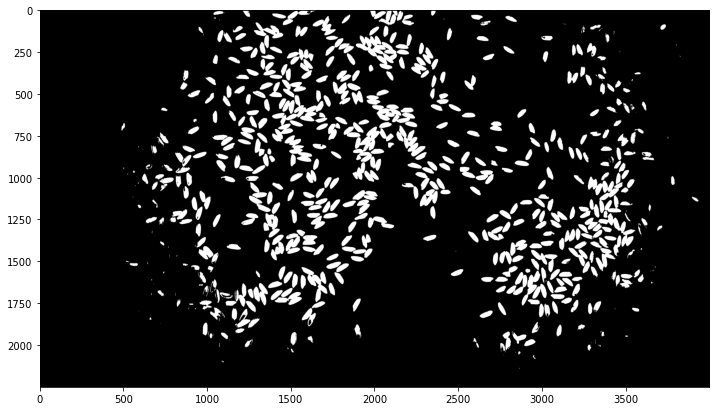

In [ ]:
# Noise removal
kernel = np.ones((3),np.uint8)
clear_image = cv2.morphologyEx(thresh,cv2.MORPH_OPEN, kernel, iterations=2)

show(clear_image)

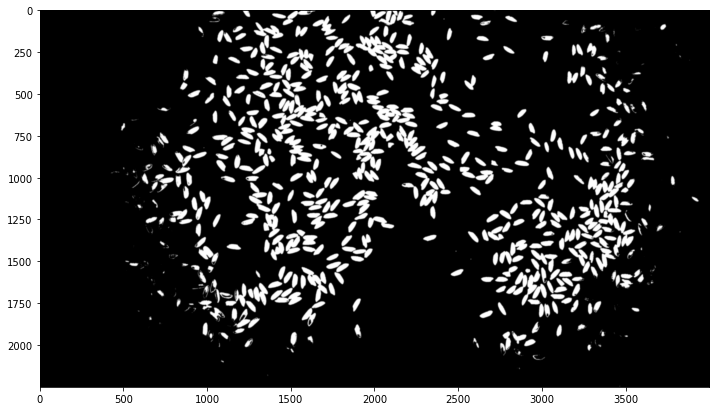

In [ ]:
#for border object blur the image
blur = cv2.GaussianBlur(thresh, (11, 11), 0)
show(blur)

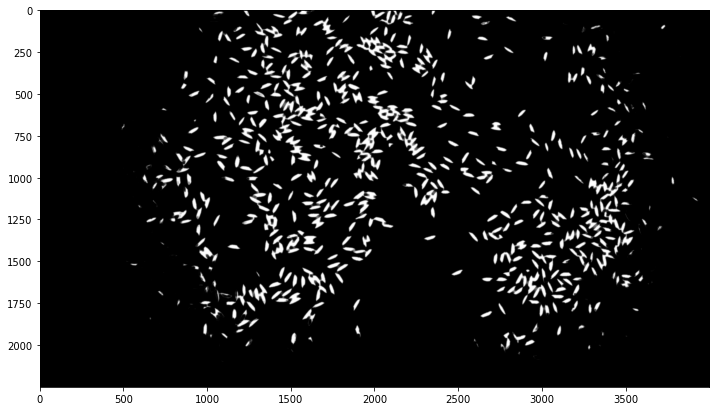

In [ ]:
# exactly define the boundaries of the foreground object using erode func

kernel = np.ones((5, 5), np.uint8)
erode = cv2.erode(blur, kernel, iterations=2)
show(erode)

Image Preprocessing


*   Image preprocessing is covers gray scale Conversion, Image Thresholding, Removal, Gaussian blurring, foreground object using erode function, Morphology etc., and it take trail and error method to capture the parameters. Noise 
*   Them the clear Image is obtained.


#watershed

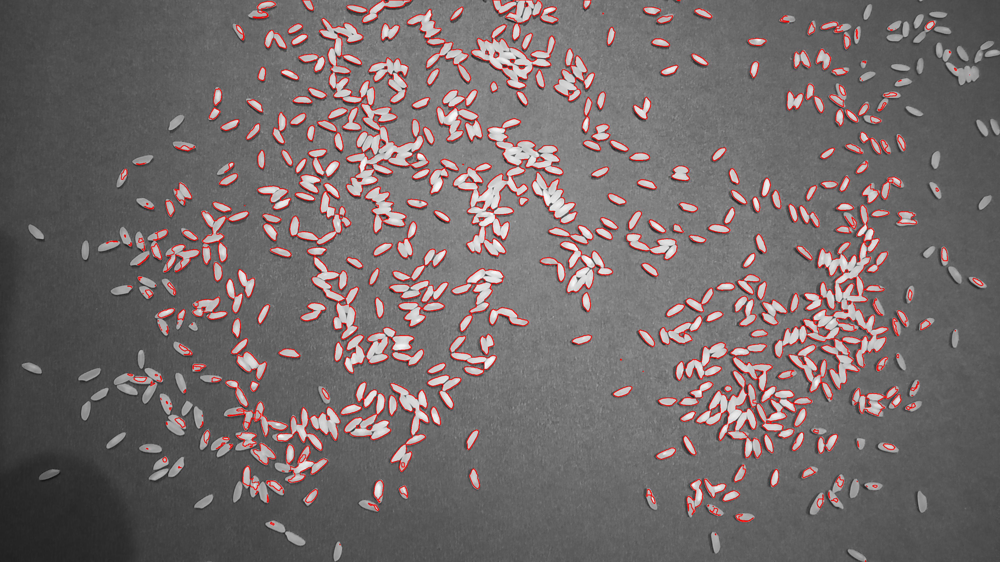

 
 Number of detected contours 413


In [ ]:
#using Countours method to find the count of grains

contours, h = cv2.findContours(erode,cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

output = cv2.cvtColor(gray, cv2.COLOR_GRAY2BGR)
cv2.drawContours(output, contours, -1, (0, 0, 255), 2)

cv2_imshow(output)

print(" \n Number of detected contours", len(contours))

In the above images, lot of rice were touching with one another. 

So that, Countours methods treated those rices as one rice grains.

hence, the no.of raice grains were reduced.

#importing necessary packages for the watershed algorithms

In [ ]:
from PIL import Image 
from numpy import asarray 
import matplotlib.image as mpimg
from scipy import ndimage
from skimage import filters, feature, measure, color
from skimage.segmentation import watershed

Number of Rice grains are : 566


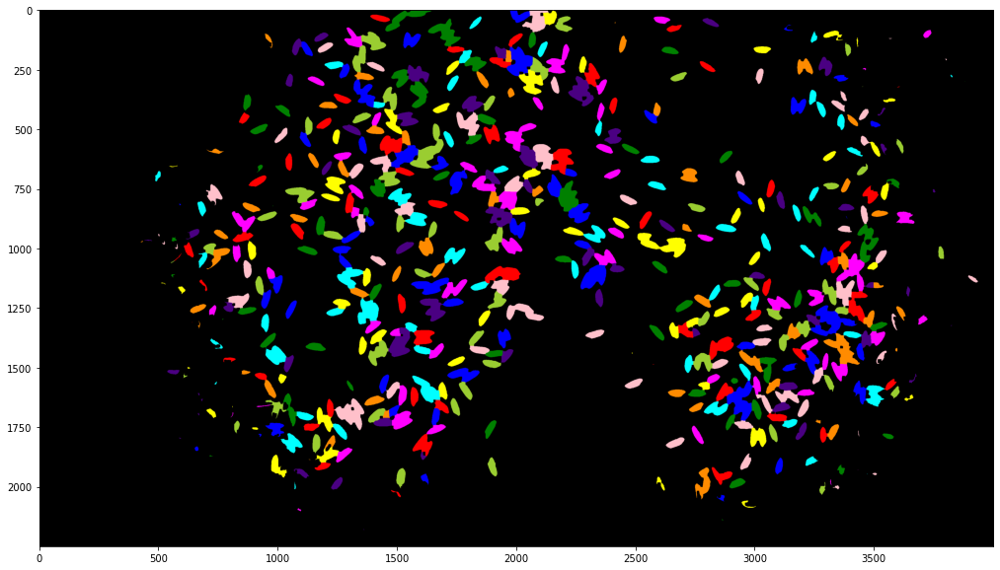

In [ ]:
#Applying  distance_transform_edt to computes the distance

dist = ndimage.distance_transform_edt(erode)
local_max = feature.peak_local_max(dist, min_distance=23)

local_max_mask = np.zeros(dist.shape, dtype=bool)
local_max_mask[tuple(local_max.T)] = True

#Aplying Watershed algorithm
labels = watershed(-dist, measure.label(local_max_mask), mask=erode)

plt.figure(figsize=(30,10))
plt.imshow(color.label2rgb(labels, bg_label=0))
print("Number of Rice grains are : %d" % labels.max())

In [ ]:
count = []
a=[]


#count the contours object using iteration
for x in contours:

  #Using contourArea method to calculate of rice
  area = cv2.contourArea(x)
  a.append(area)
  if area < 800 and area >100 :
    count.append(x)

print("Total number of broken rice present in the Image is: ",len(count))

Total number of broken rice present in the Image is:  92


In [ ]:
area_=pd.Series(a)
area_.describe()

count      413.000000
mean      2746.027845
std       7986.301778
min          0.000000
25%        180.000000
50%       1176.000000
75%       1819.000000
max      95470.000000
dtype: float64

Solving Grains touching Problem


*   there is an object touching or overlapping problem, here image segmentation needs to solve these difficulties.
*   So, eradicate these issues, I applied the Watershed Algorithm:


Watershed Algorithm is based on extracting sure background and foreground and then using markers will make the watershed algorithm run and detect the exact boundaries.
It exactly finds the center of each object using Euclidean distance


#for all the 5 images


In [ ]:
def main(image):
  inputImage = cv2.imread(i)

  image = cv2.cvtColor(inputImage, cv2.COLOR_BGR2RGB)

  #convert the raw image to the gray
  gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

  #then cobert the gray image to threshold
  _, thresh = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY)

  kernel = np.ones((3),np.uint8)
  clear_image = cv2.morphologyEx(thresh,cv2.MORPH_OPEN, kernel, iterations=2)

  #for border object blur the image
  blur = cv2.GaussianBlur(thresh, (11, 11), 0)

  # exactly define the boundaries of the foreground object using erode func
  kernel = np.ones((5, 5), np.uint8)
  erode = cv2.erode(blur, kernel, iterations=2)

  #using Countours to the count of grains

  contours, hierarchy = cv2.findContours(erode,cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  output_contour = cv2.cvtColor(erode, cv2.COLOR_GRAY2BGR)
  #cv2.drawContours(output_contour, contours, -1, (0, 0, 255), 2)


  dist_trans = ndimage.distance_transform_edt(erode)
  local_max = feature.peak_local_max(dist_trans, min_distance=23)


  local_max_mask = np.zeros(dist_trans.shape, dtype=bool)
  local_max_mask[tuple(local_max.T)] = True

  #Aplying Watershed algorithm
  labels = watershed(-dist_trans, measure.label(local_max_mask), mask=erode) # separate merged corns
  count = []
  for x in contours:
    area = cv2.contourArea(x)
    if area < 800 and area <180 :
      count.append(x)
      
  return [labels.max(), len(count)]

In [ ]:
image=["/content/image_1.jpg", "/content/image_2.jpg", "/content/image_3.jpg", "/content/image_4.jpg", "/content/image_5.jpg"]

In [ ]:
data=[]
for i in image:
  data.append(main(i))

In [ ]:
data

[[524, 78], [516, 65], [552, 44], [601, 72], [585, 105]]

Counting broken rice
- After that, using labels total no of objects were got using evaluate the area of the pixels.
- I used area-based approach, where I put a threshold of 180 to 800 for half grains.


In [ ]:
# Create the pandas DataFrame
df = pd.DataFrame(data, index=["image_1.jpg", "image_2.jpg", "image_3.jpg", "image_4.jpg", "image_5.jpg"], columns = ['total_rice_grain', 'total_broken_rice_grain'])
df

,total_rice_grain,total_broken_rice_grain
image_1.jpg,524,78
image_2.jpg,516,65
image_3.jpg,552,44
image_4.jpg,601,72
image_5.jpg,585,105


In [ ]:
df.to_csv('submission.csv')